# <center>Digital Image Processing - Problem Set 5</center>

### Student Names: Jorge Aguilar, Jorge Díaz, Jorge Lambraño

### Problem 1

Write a function that describes <i>each</i> object in a binary image using the Hu statistical moments. The Hu moments are invariant to rotation, scale and translation. These moments can be defined for <i>each</i> region in a binary image. The OpenCV function to compute these moments is <tt>cv2.HuMoments</tt>. Write down the equations that compute the seven Hu moments for a region.

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:

def implot(image, cmap, title, axis):
    #display image
    try:
        if cmap == 'gray':
            plt.imshow(image, cmap=cmap)
        elif cmap == 'color':
            plt.imshow(image)
    except ValueError:
        print('Image not found')

    # add title to image
    try:
        plt.title(title)
    except ValueError:
        print('Title not valid')

    try:
        if(axis == True):
            plt.axis('on')
        elif(axis == False):
            plt.axis('off')
    except ValueError:
        print('invalid value')



Image: files/shapes.png

Region 1
Hu moment 1: 0.0032393024086371457
Hu moment 2: 6.361574274392578e-06
Hu moment 3: 1.5174935358608804e-09
Hu moment 4: 1.7845559715649921e-09
Hu moment 5: 2.828271888725964e-18
Hu moment 6: 4.476525546212933e-12
Hu moment 7: 7.906006379441362e-19

Region 2
Hu moment 1: 0.0032393024086371457
Hu moment 2: 6.361574274392578e-06
Hu moment 3: 1.5174935358608804e-09
Hu moment 4: 1.7845559715649921e-09
Hu moment 5: 2.828271888725964e-18
Hu moment 6: 4.476525546212933e-12
Hu moment 7: 7.906006379441362e-19

Region 3
Hu moment 1: 0.0032393024086371457
Hu moment 2: 6.361574274392578e-06
Hu moment 3: 1.5174935358608804e-09
Hu moment 4: 1.7845559715649921e-09
Hu moment 5: 2.828271888725964e-18
Hu moment 6: 4.476525546212933e-12
Hu moment 7: 7.906006379441362e-19

Region 4
Hu moment 1: 0.0032393024086371457
Hu moment 2: 6.361574274392578e-06
Hu moment 3: 1.5174935358608804e-09
Hu moment 4: 1.7845559715649921e-09
Hu moment 5: 2.828271888725964e-18
Hu moment 6: 4.47

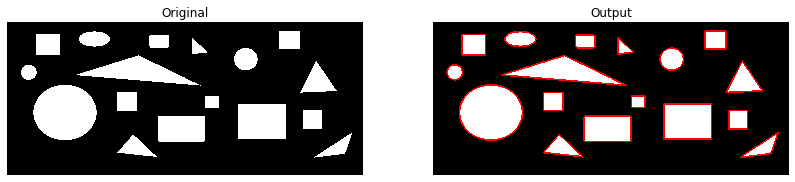


Image: files/crosses.png

Region 1
Hu moment 1: 0.004782027897032148
Hu moment 2: 2.6725658930605953e-06
Hu moment 3: 1.5886625605396681e-09
Hu moment 4: 4.667103424595462e-11
Hu moment 5: 1.1558947721381323e-20
Hu moment 6: 7.475934197288202e-14
Hu moment 7: -5.281216876943084e-21

Region 2
Hu moment 1: 0.004782027897032148
Hu moment 2: 2.6725658930605953e-06
Hu moment 3: 1.5886625605396681e-09
Hu moment 4: 4.667103424595462e-11
Hu moment 5: 1.1558947721381323e-20
Hu moment 6: 7.475934197288202e-14
Hu moment 7: -5.281216876943084e-21

Region 3
Hu moment 1: 0.004782027897032148
Hu moment 2: 2.6725658930605953e-06
Hu moment 3: 1.5886625605396681e-09
Hu moment 4: 4.667103424595462e-11
Hu moment 5: 1.1558947721381323e-20
Hu moment 6: 7.475934197288202e-14
Hu moment 7: -5.281216876943084e-21

Region 4
Hu moment 1: 0.004782027897032148
Hu moment 2: 2.6725658930605953e-06
Hu moment 3: 1.5886625605396681e-09
Hu moment 4: 4.667103424595462e-11
Hu moment 5: 1.1558947721381323e-20
Hu moment 6: 

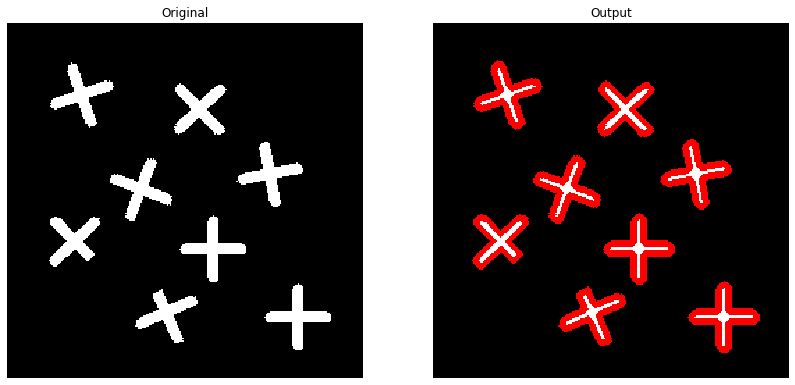

In [3]:
%matplotlib inline

def imobject(image):
    #find contours
    _, contours, hier = cv2.findContours(image.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    HMList = []
    for cont in contours:
        #return objects
        HM = cv2.HuMoments(cv2.moments(image)).flatten()
        #add item to Hlist
        HMList.append(HM)

    #convert binary image in color image to visulize the contourns
    img_3channels = cv2.cvtColor(image,cv2.COLOR_GRAY2BGR)
    # draw contours red
    cv2.drawContours(img_3channels, contours, -1, (255,0,0), 3)
    #return image and list
    return img_3channels, HMList

def printitem(item):
    n = 0
    for i in item:
        n = n + 1
        print('Hu moment ' + str(n) + ': ' + str(i))

def main1():
    filenames = [
        'files/shapes.png',
        'files/crosses.png',
        #'images/spheres.jpg'
        ]

    for name in filenames:
        #load image
        image = cv2.imread(name, cv2.IMREAD_GRAYSCALE)
        # plt.imshow(image, cmap='gray')
        # plt.show()
        # print(name)

        #proccess objects into image
        image_out, HMList = imobject(image)

        print('\nImage: ' + name )

        i = 1
        for item in HMList:
            print('\nRegion ' + str(i))
            i = i + 1
            printitem(item)
            #print('\n')

        #display original and output image
        plt.figure(figsize=(14,14))
        #original image
        plt.subplot(1,2,1)
        implot(image, 'gray', 'Original', False)
        #output image
        plt.subplot(1,2,2)
        implot(image_out, 'color', 'Output', False)
        #add tittle to figure
        #plt.suptitle(name, fontsize=16)

        plt.show()

if __name__ == '__main__':
    main1()

### Results

This algorithm extracts Hu Moments from the object silhouette. Hu Moments allows describe a shape from an image and they are invariant to rotation and translation. 

The function **imobject** is used to identify objects and contours from an binary image. The first step is finding objects using **findContours**. The output from findContours function represents the contours of each object: numbers of contours and numbers of objects is the same.  Hu Moments of each contours is computer using **HuMoments** function. This function return a list of seven items which represents Hu moments values for this contours. Finally **imobject** function also draw a red line on contours of shapes. 


### Problem 2

Write a function that detects corners on an image using the Harris corner detection method. You can use the OpenCV built-in functions. Your function should output the $N$ detected corner locations in a $2 \times N$ matrix. Visualize your results by plotting the corners on top of the input image.  Apply your function to the binary image <tt> shapes.png</tt> and to the grayscale image <tt>face.tif</tt>.

files/chessboard.png


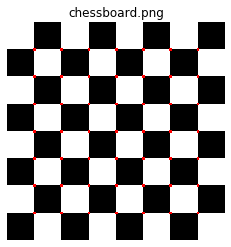

files/shapes.png


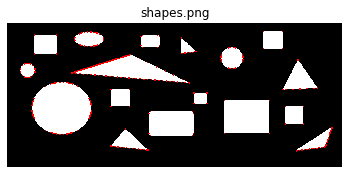

files/face.tif


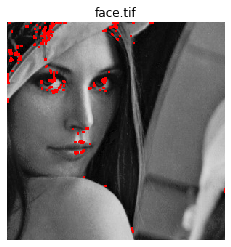

In [4]:
%matplotlib inline

def imcorners(image):
    
    img_gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    img_gray = np.float32(img_gray)

    dst = cv2.cornerHarris(img_gray,2,3,0.04)
    dst = cv2.dilate(dst,None)
    # Threshold for an optimal value, it may vary depending on the image.
    image[dst>0.01*dst.max()]=[0,0,255]

    return image

def main2():

    images = ['chessboard.png','shapes.png','face.tif']

    for name in images:

        image_filename = 'files/' + name
        
        print(image_filename)
        
        img = cv2.imread(image_filename)
        img_out = imcorners(img.copy())
        
        img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        img_gray = np.float32(img_gray)

        dst = cv2.cornerHarris(img_gray,2,3,0.04)

        #result is dilated for marking the corners, not important
        dst = cv2.dilate(dst,None)

        # Threshold for an optimal value, it may vary depending on the image.
        img[dst>0.01*dst.max()]=[255,0,0]

        plt.figure()
        plt.imshow(img,cmap='gray')
        plt.title(name)
        plt.axis('off')
    
        #display images 
        plt.show()

if __name__ == "__main__":
    main2()

### Results

Using function **cv2.cornerHarris()**, we can detect corners of a binary image or a grayscale image. This function use formula called *Harris Corner Detector*, and its structure is:

*dst = cv2.cornerHarris(src, blockSize, ksize, k)*

Were **src** is the image, this image previously should be converted to float using formula **np.float32()**. Parameter **blockSize** describe a neighborhood size of $blockSize \times blockSize$. Parameter **ksize** correspond to kernel size of sobel operator in order to calculate image derivate. And finally, **k** is a free parameter of function function cornerHarris(), opencv documentation assign to k a value of 0.04

After to use **cv2.cornerHarris()**, it’s necessary to draw corners. **dst** parameter contain scores of harris corner algorithm, opencv documentation explain if a score of dst is higher than other value, it can be considered a corner. In documentation, the other value is $0.01 * dst.max()$, but this value could be changed depending on the image.


### Problem 3

A company that bottles a variety of industrial chemicals has heard
of your success solving imaging problems and hires you to design an approach
for detecting when bottles are not full. The bottles appear as shown below
as they move along a conveyor line past an automatic
filling and capping station. A bottle is considered imperfectly filled when the
level of the liquid is below the midway point between the bottom of the neck and
the shoulder of the bottle.The shoulder is defined as the region of the bottle
where the sides and slanted portion of the bottle intersect. The bottles are
moving, but the company has an imaging system equipped with an illumination
flash front end that effectively stops motion, so you will be given images that
look very close to the sample shown below.

<img src="files/bottles.png" width="320"/>

Propose a solution for detecting
bottles that are not filled properly. State clearly all assumptions that you
make and that are likely to impact the solution you propose. Implement your
solution and apply it to the images <tt>bottles.tif, new_bottles.jpg</tt> and <tt> three_bottles.jpg</tt>. Visualize the results
of your algorithm by highlighting with false colors
the regions that are detected as correctly
filled bottles and the regions that are detected as not properly filled bottles.

files/bottles.png
number of bottles: 5
full bottles: 4
empty bottles: 1
bottles.png


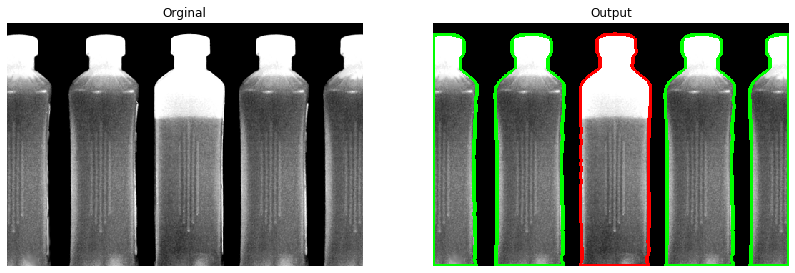

files/new_bottles.jpg
number of bottles: 5
full bottles: 4
empty bottles: 1
new_bottles.jpg


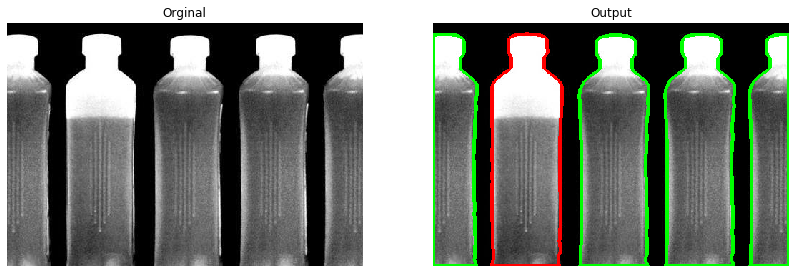

files/three_bottles.jpg
number of bottles: 5
full bottles: 2
empty bottles: 3
three_bottles.jpg


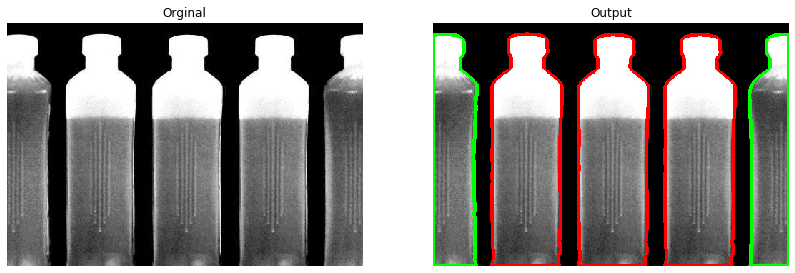

In [5]:
%matplotlib inline

def imthreshold(image, th):
    #image = cv2.GaussianBlur(image,(5,5),0)
    ret3,adap_th = cv2.threshold(image, th, 255, cv2.THRESH_BINARY)
    adap_th = cv2.medianBlur(adap_th,7)
    return adap_th

def imbottles(image):
    # thr image
    adap_th = imthreshold(image, 40)
    # creane a 3 channels image
    imout = cv2.cvtColor(adap_th, cv2.COLOR_GRAY2BGR)
    # dectecting bottles borders
    _, contours,_ = cv2.findContours(adap_th.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    total = len(contours)
    #print (len(contours))
    #convert binary image in color image to visulize the contourns
    img_3channels = cv2.cvtColor(image,cv2.COLOR_GRAY2BGR)

    print('number of bottles: ' + str(total))
    index = 0
    for cnt in contours:
        
        # generate a rectangle
        box = np.int0(cv2.boxPoints(cv2.minAreaRect(cnt)))

        imbot = image[box[1][1]:box[0][1], box[0][0]:box[3][0]]

        # Get the empty part of the bottle
        bottle = imthreshold(imbot, 200)

        h = bottle.shape[0]
        #print('h= ' + str(h))
        
        mean = np.mean(bottle) / 255
        condition = mean > 0.15
        # mean = np.mean(bottle[int(0.25*h):][:]) > 10

        # identify if bottle is empty or full using an threshold level
        if condition:
            cv2.drawContours(img_3channels, [cnt], -1, (255,0,0), 3)
            index = index + 1
        else:
            cv2.drawContours(img_3channels, [cnt], -1, (0,255,0), 3)

    print('full bottles: ' + str(total - index))
    print('empty bottles: ' + str(index))
        
    return img_3channels

def main3():
    
    filenames = ['bottles.png','new_bottles.jpg','three_bottles.jpg']
    for name in filenames:
        
        filename = 'files/' + name
        print(filename)
        #load file 
        image = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
        imout = imbottles(image)
        
        print(name)
        
        plt.figure(figsize=(14,14))
        plt.subplot(1,2,1)
        plt.imshow(image, cmap = 'gray')
        plt.title('Orginal')
        plt.axis('off')

        plt.subplot(1,2,2)
        plt.imshow(imout)
        plt.title('Output')
        plt.axis('off')

        #plt.suptitle(name, fontsize=16)

        plt.show()

if __name__ == '__main__':
    main3()


### Results

The above algorithm can detect if a bottle is full or empty, full bottles are green and empty bottles are red.

To achieve the above results, first we apply a threshold to binarize the image and a smoothing in order to erase noise, then **cv2.findContours()** is used for catching all bottles of the image, finally we print length of detected contours and check if all bottles was detected.

After to detect all bottles, the second step is to verify each bottle. To do this we use **cv2.boxPoints( cv2.minAreaRect(cnt) )** to generate a box and then catch a determined bottle of the image. Variable **imbot** contains the image of catched bottle, for this image we apply a thresholding, then we calculate the average of the image and if this value is higher than 10, bottle is considered empty.

Finally, we draw each bottle depending on if full or empty.

### Problem 4

Suppose that you are observing objects in the night sky. Suppose that only ‘big’ objects are important to your observation. In this scenario, ‘small’ objects are considered noise. Write a python function that processes the image as follows:

1. Use a 15x15 averaging filter to blur the image.

2. Apply a threshold of 0.25 to binarize the resulting blurred image.

3. Use the binary image to ‘mask’ the noise of the original image: simply perform an element-wise multiplication of the binary image and the original image.

4. Use connected component analysis on the binary image to count the number of ‘big’ objects found.

The function should take three inputs: an image matrix, the size of the averaging filter and threshold value. Make sure your function displays the intermediary results of each step outlined above.

Apply your function to the input image ‘hubble-original.tif’. Try different values of smoothing kernel size and threshold value. Analyze the relationship between number of objects found and smoothing kernel size and threshold value. In particular, you might want to observe the result when using an averaging filter of size n=1 (i.e. no smoothing).

In [6]:
import itertools

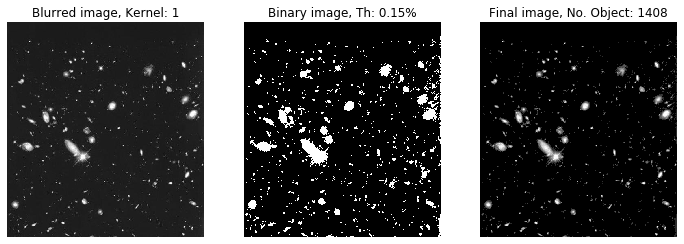

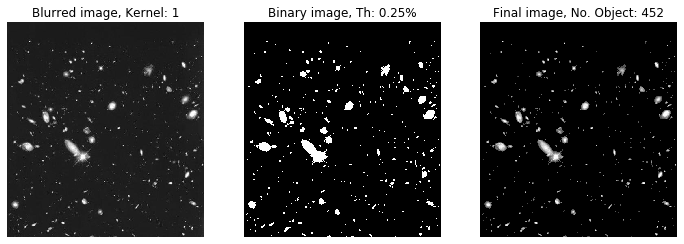

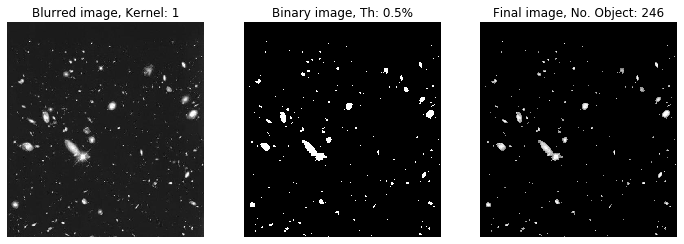

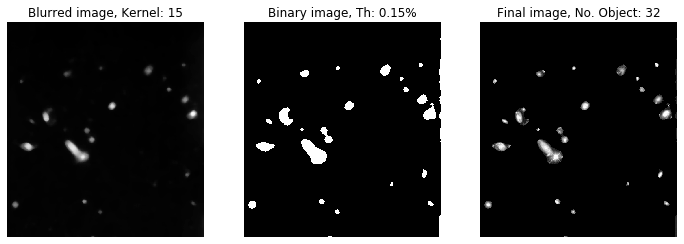

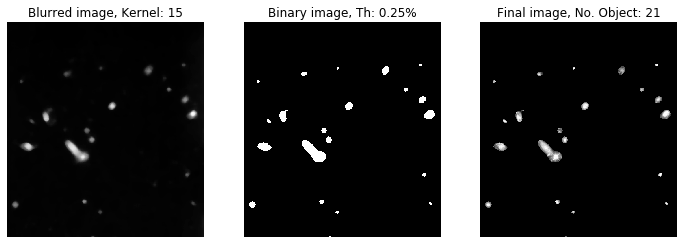

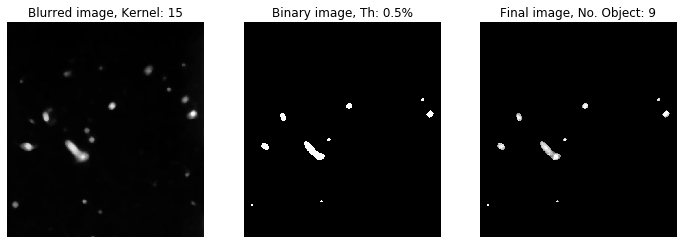

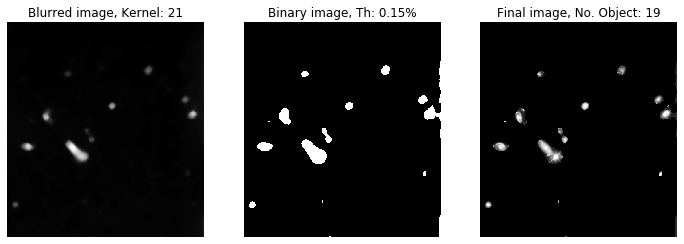

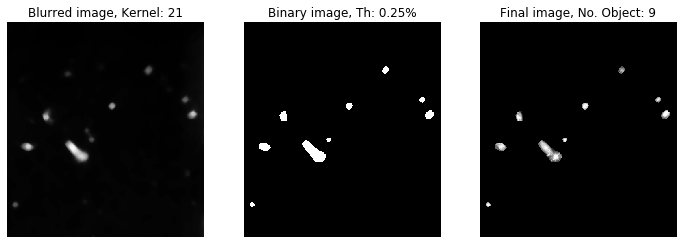

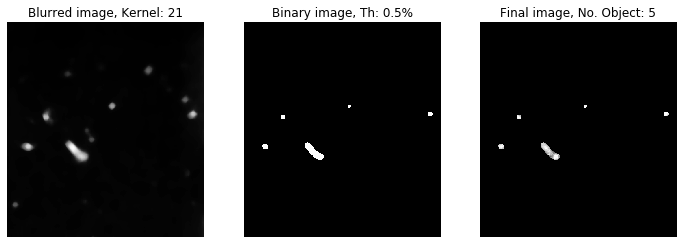

In [7]:
%matplotlib inline

def detectBigObjects(image,kernel,threshold):
    blur = cv2.medianBlur(image,kernel)
    _,image_th = cv2.threshold(blur,threshold*255,1,cv2.THRESH_BINARY)
    img2 = image*image_th
    _, contours, hierarchy = cv2.findContours(img2, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    return [blur,image_th,img2],contours

def main():

    images = ['hubble-original.tif']
    kernel_sizes = [1,15,21]
    Th_values = [0.15,0.25,0.5]

    for name in images:
        img = cv2.imread('files/'+name,0)
        
        combs = itertools.product(kernel_sizes, Th_values)
        
        for K,T in combs:

            new_images,n = detectBigObjects(img,K,T)

            plt.figure(figsize=(12,12))
            plt.subplot(1,3,1)
            plt.imshow(new_images[0],cmap='gray')
            plt.title('Blurred image, Kernel: '+str(K))
            plt.axis('off')

            plt.subplot(1,3,2)
            plt.imshow(new_images[1],cmap='gray')
            plt.title('Binary image, Th: '+str(T)+'%')
            plt.axis('off')

            plt.subplot(1,3,3)
            plt.imshow(new_images[2],cmap='gray')
            plt.title('Final image, No. Object: '+str(len(n)))
            plt.axis('off')

            plt.show()

if __name__ == "__main__":
    main()

### Results

The final algorithm clusters keypoints in 100 groups, according the position on the image.  Similar to last code, SIFT class is used to identify and extract local interested points, for this reason, **imlip** function is implemented. After to get keypoints and descriptors from each car image, this features are the input of **grupdes** function. 

**groupes** function computers centroids and an array that indicates which group each keypoint belongs. This can be obtained used **kmeans** algorithm, where distance and position (x,y) are the feature to sort keypoints. Function returns *centroids*, the numbers of centroids is the same numbers to groups. Each group have a centroid, and points closer to it belong to the group. The output array have the same length to numbers to keypoints, and its value indicate the centroid closer to each keypoints. 

So, the array can be used to make a **histogram**, the histogram show which groups have more keypoints. Similar to last code, original image and keypoints image are displayed. In addition centroids and keypoints are displayed, cetroids are represented by red starts and keypoints are black dots. 

For each image, centroids, histogram and output array is stored using a **json** file. Data are stored using a *dictionary* called **data**.  The **storedata** function is used to save data inside of **.json** file. 


### Problem 5

Write a function that extracts local interest points and computes
their descriptors using the SIFT transform. You can find implementations of
the SIFT transform in OpenCV.


Your function should return two matrices: A first matrix of size $3 \times N$, where $N$ is the number of detected points in the image, and the 3 elements correspond to the $x$, $y$ locations and $s$ size of the detected points. A second matrix of size $128 \times N$ that contains the SIFT descriptor of each interest point.

Apply your function to all car images <tt>image_00XX.jpg</tt>.
Store the results of each image in a separate data file.

In [8]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [9]:
from os import listdir, path, makedirs
import json

In [10]:
# local interested points on image
def imlip(image):
    #convert to gray image
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sift = cv2.xfeatures2d.SIFT_create()
    return sift.detectAndCompute(gray,None)

def kpmat(kp):
    kpmat = np.zeros((len(kp),3))
    for i,k in enumerate(kp):
        kpmat[i,0] = k.pt[0]
        kpmat[i,1] = k.pt[1]
        kpmat[i,2] = k.size
    return kpmat

image_0010.jpg
numbers keypoints: 459
image_0010.jpg


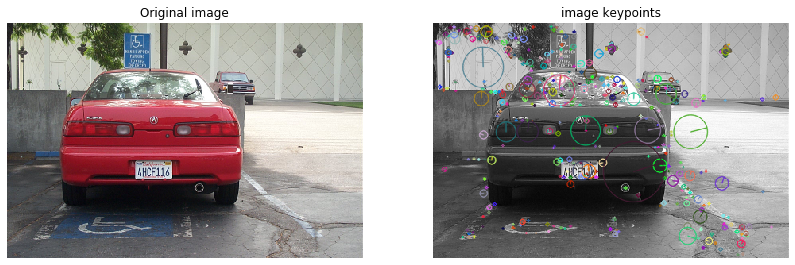

image_0001.jpg
numbers keypoints: 537
image_0001.jpg


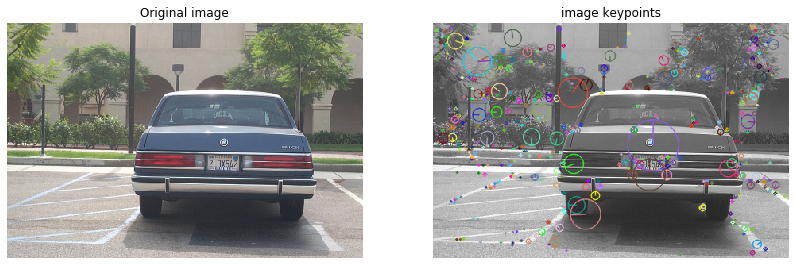

image_0008.jpg
numbers keypoints: 684
image_0008.jpg


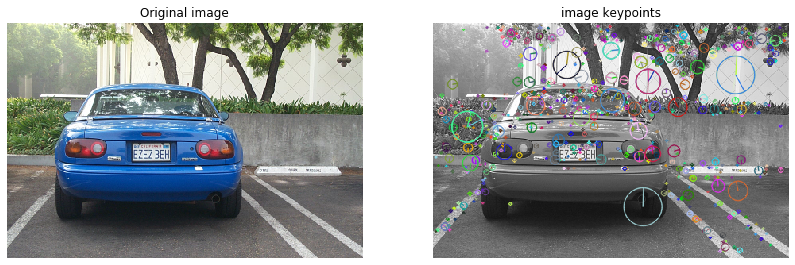

image_0015.jpg
numbers keypoints: 517
image_0015.jpg


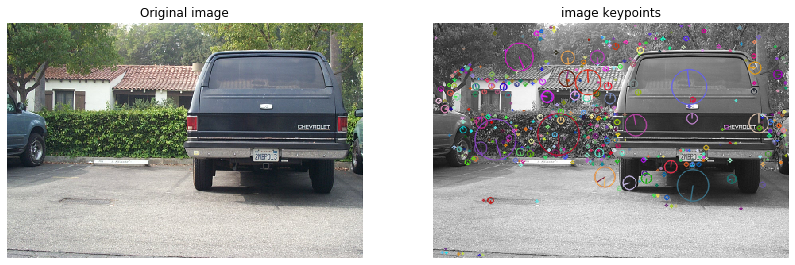

image_0017.jpg
numbers keypoints: 804
image_0017.jpg


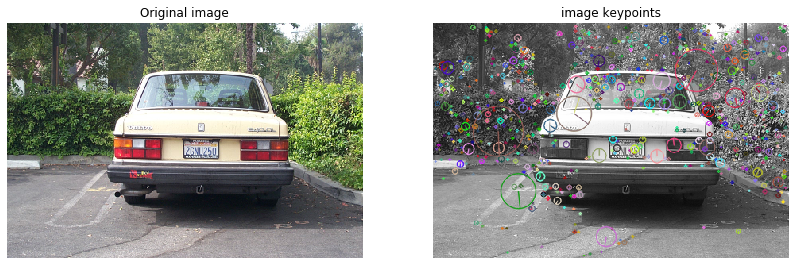

image_0016.jpg
numbers keypoints: 649
image_0016.jpg


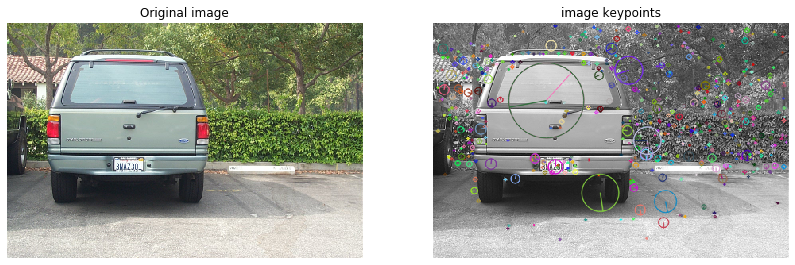

image_0009.jpg
numbers keypoints: 638
image_0009.jpg


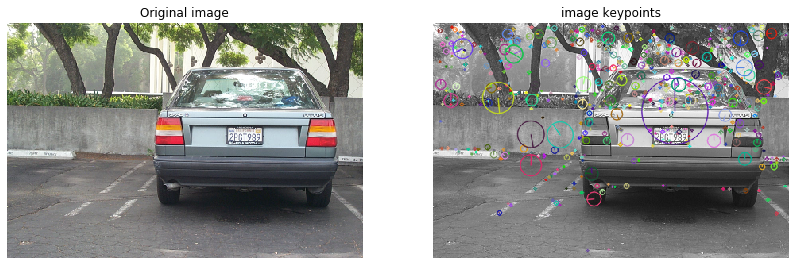

image_0002.jpg
numbers keypoints: 442
image_0002.jpg


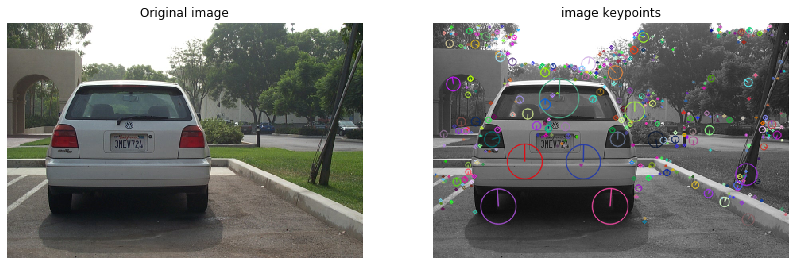

image_0020.jpg
numbers keypoints: 862
image_0020.jpg


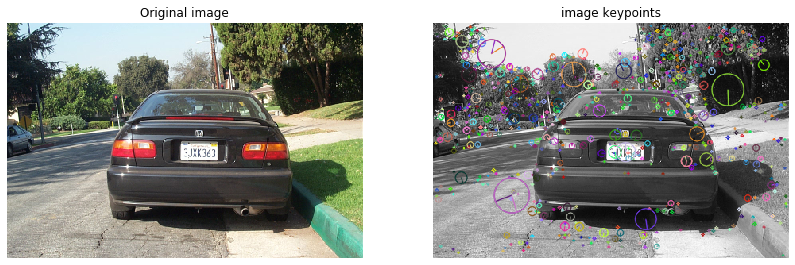

image_0018.jpg
numbers keypoints: 679
image_0018.jpg


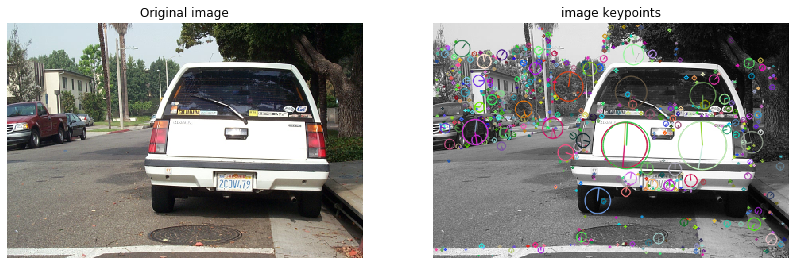

image_0003.jpg
numbers keypoints: 610
image_0003.jpg


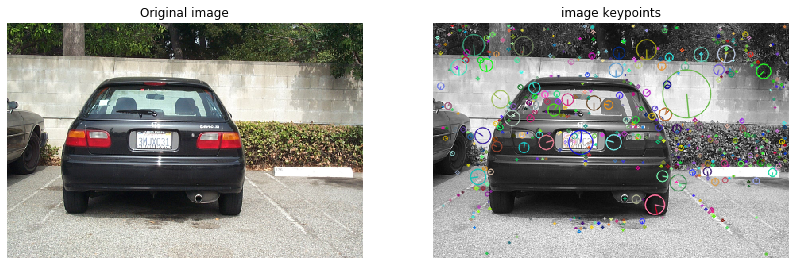

image_0014.jpg
numbers keypoints: 785
image_0014.jpg


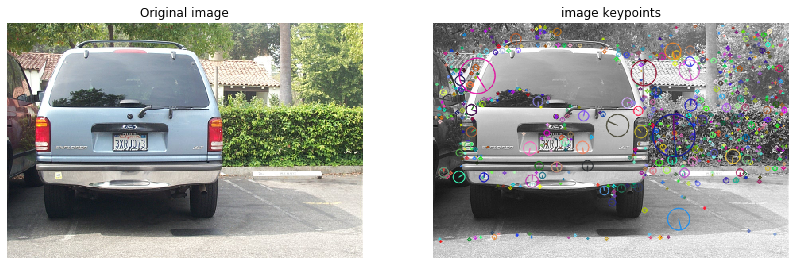

image_0012.jpg
numbers keypoints: 795
image_0012.jpg


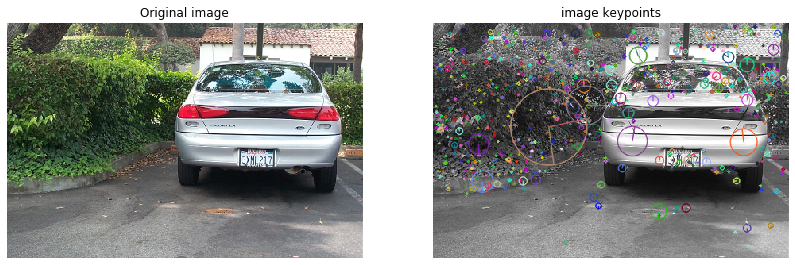

image_0013.jpg
numbers keypoints: 1042
image_0013.jpg


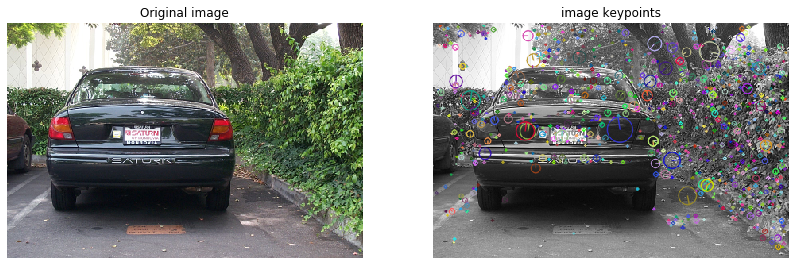

image_0005.jpg
numbers keypoints: 510
image_0005.jpg


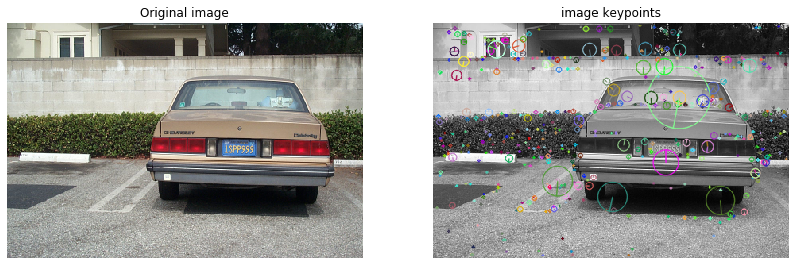

image_0004.jpg
numbers keypoints: 488
image_0004.jpg


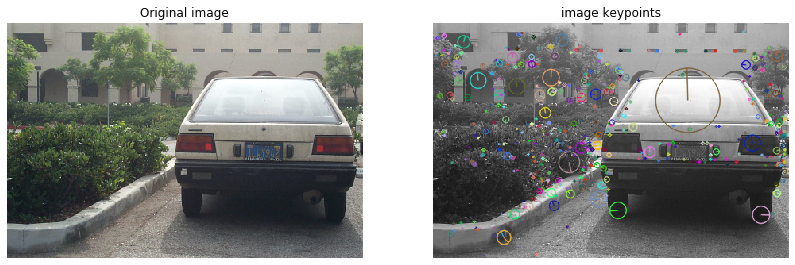

image_0007.jpg
numbers keypoints: 812
image_0007.jpg


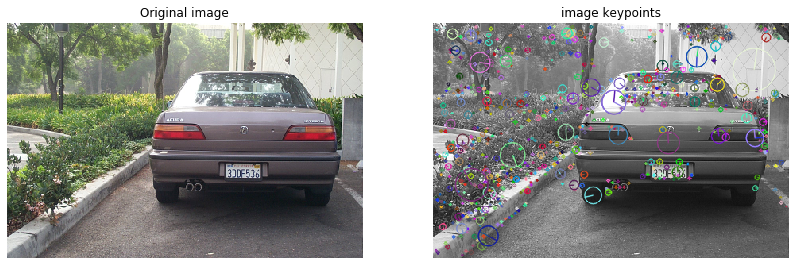

image_0011.jpg
numbers keypoints: 349
image_0011.jpg


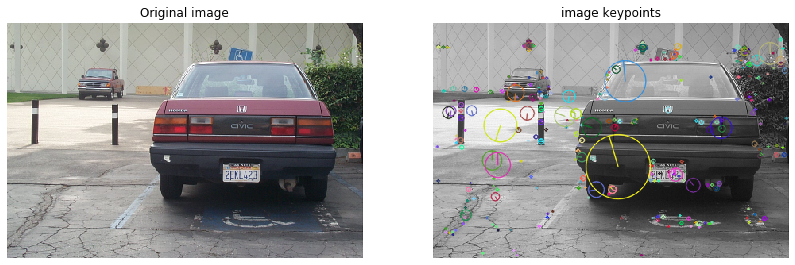

image_0019.jpg
numbers keypoints: 744
image_0019.jpg


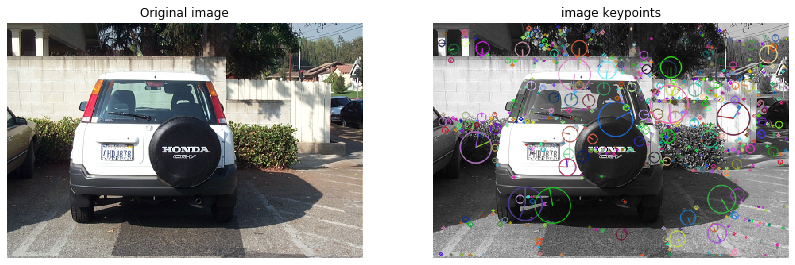

image_0006.jpg
numbers keypoints: 576
image_0006.jpg


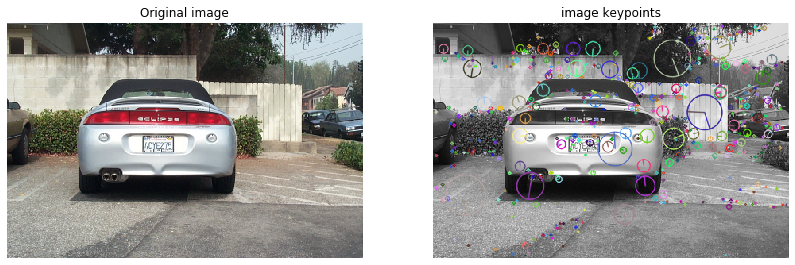

In [11]:

#main functio n
def main5():
    # load the filename of car images
    dirname = 'files/cars/'
    # filter by name
    filenames = [item for item in listdir(dirname)
                 if item[:6] == 'image_' and item[10:] == '.jpg']
    
    for name in filenames:
        
        print(name)
        
        #load image
        image = cv2.cvtColor(cv2.imread(dirname + name, cv2.IMREAD_COLOR), cv2.COLOR_RGB2BGR)
        image = cv2.resize(image, (0,0), fx=0.5, fy=0.5)
        #display original image
        plt.figure(figsize=(14,14))
        plt.subplot(1,2,1)
        plt.imshow(image)
        plt.title('Original image')
        plt.axis('off')
        
        # find interested points
        kp, des = imlip(image)
        print('numbers keypoints: ' + str(len(kp)))

        #Stored data using json
        #create dir
        directory = 'json/descriptions_and_points'
        if not path.exists(directory):
            makedirs(directory)
        #create file
        jsonfile = open(directory + '/' + name[:len(name)-4] + '_kp_des.json', 'w')
        #init data as dictionary
        data = {"points": kpmat(kp).tolist(),"descriptors": des.tolist()}
        #save data
        json.dump(data,jsonfile, sort_keys=True, indent=4)
        #close file
        jsonfile.close()

        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        imout = cv2.drawKeypoints(gray, kp, gray, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        #display output image
        plt.subplot(1,2,2)
        plt.imshow(imout)
        plt.title('image keypoints')
        plt.axis('off')
        #set title
        #plt.suptitle(name, fontsize=16)
        print(name)
        #show
        plt.show()
            

#run main function
if __name__ == '__main__':
    main5()


### Results

The algorithm extracts local interest points from an image, computers their descriptors and stores those datas. The SIFT (Scale-Invariant Feature Transform) Algorithm is used to get interested points. 

The first step is read the image using **cv2.imread** function. Image inside **cars** directory are selected, also a filter by name is used. 

The output of this function (the image) is the input of **imlip** function. **imlip** finds features of the image. Inside of **imlip**, a **sift** object is made in order to detect keypoints and descriptors. The method **detectAndCompute** of **sift** object. From the keypoints, position (coordinates x and y) and the size are extracted and stored in an new array **kpmat**. In addition, **imlip** draws keypoinst on the grayscale version of the original image. Later, both images: original and keypoints image are displayed. **imlip** returns keypoints image, kpmat and descriptors. 

In order to stored the image date, **json** library is used. Data is stored in **.json** file, the path of the file is a new directory **json/descriptions_and_points**,  which is made using **os.makedirs** function. All data is stored inside of a *dictionary*, and **json.dump** function write the dictionary on the json file. 


### Problem 6

Write a Python function that computes the bag-of-features representation of an image. In order to accomplish this, your function will need to perform the following steps:

1. Load the input image and apply the SIFT transform to obtain descriptors from its interest points. 
2. Group descriptors: Your function should use the k-means clustering algorithm to group all input features into k=100 groups.
3. Compute a histogram that counts how many times each codebook entry is selected as the closest center.

Apply your function to all car images <tt>image_00XX.jpg</tt>. Store the result in a data file.


In [12]:
import os
import json
from sklearn.cluster import KMeans

In [13]:

def groupdes(kp, des):
    # define array with positions
    kpmap = kpmat(kp)
    X = np.array(list(zip(kpmap[:,0], kpmap[:,1])))

    # Number of clusters
    kmeans = KMeans(n_clusters=100)
    # Fitting the input data
    kmeans = kmeans.fit(X)
    # Getting the cluster labels
    labels = kmeans.predict(X)

    # Centroid values
    centroids = kmeans.cluster_centers_
    return centroids, labels


def storedata(filename, data):
    #create file
    jsonfile = open(filename, 'w')
    #save data
    json.dump(data,jsonfile, sort_keys=True, indent=4)
    #close file
    jsonfile.close()


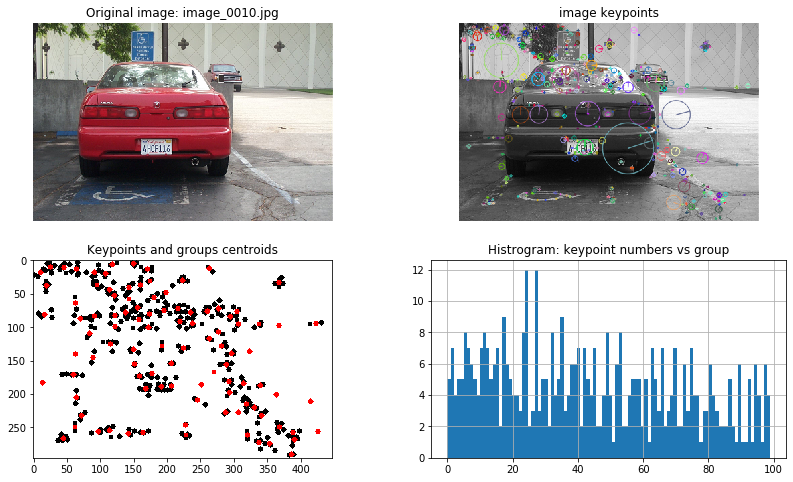

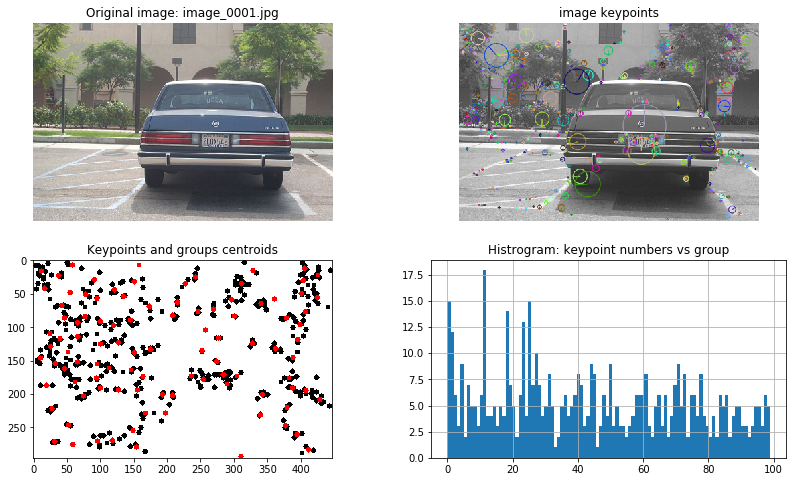

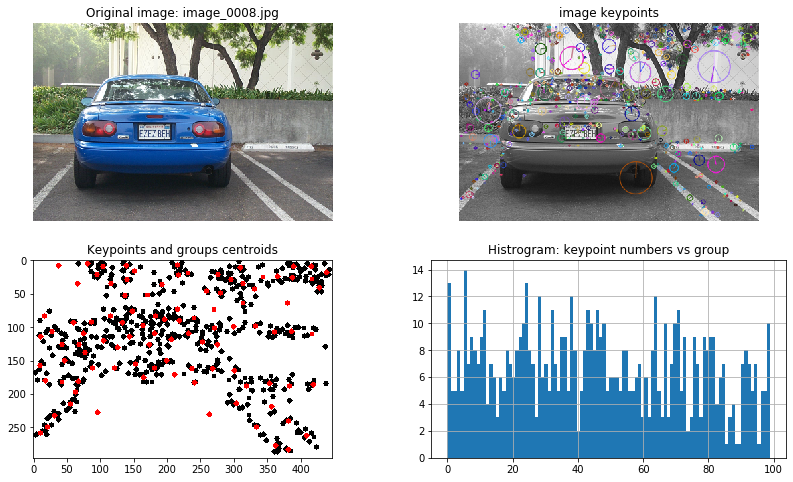

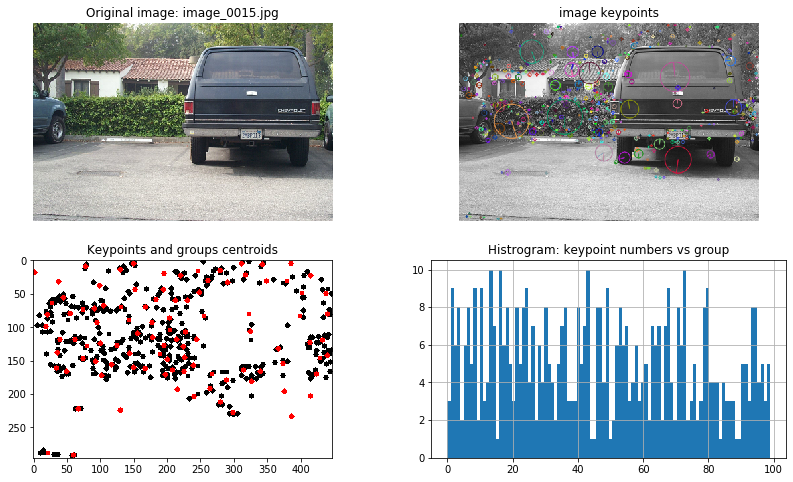

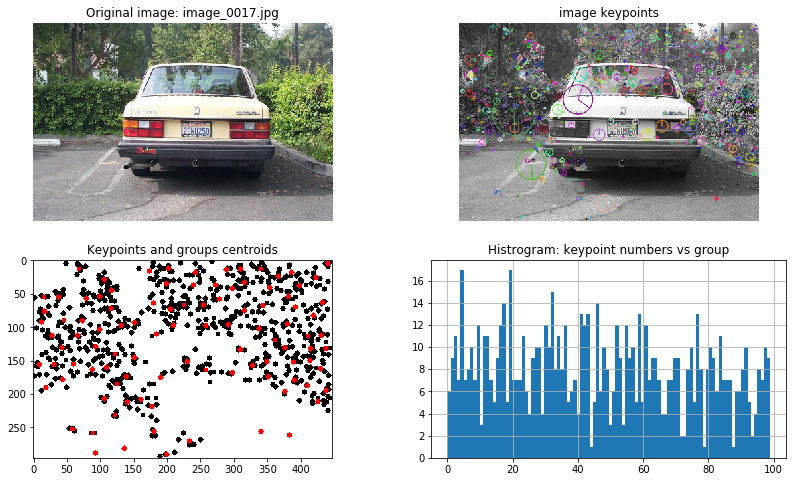

...

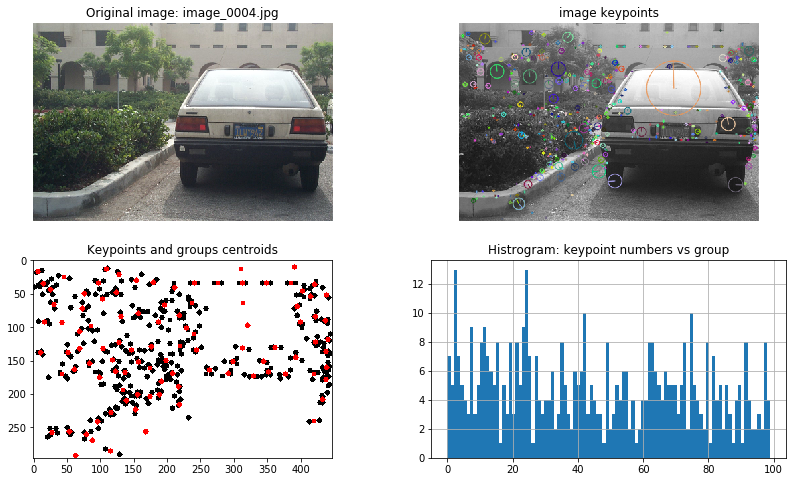

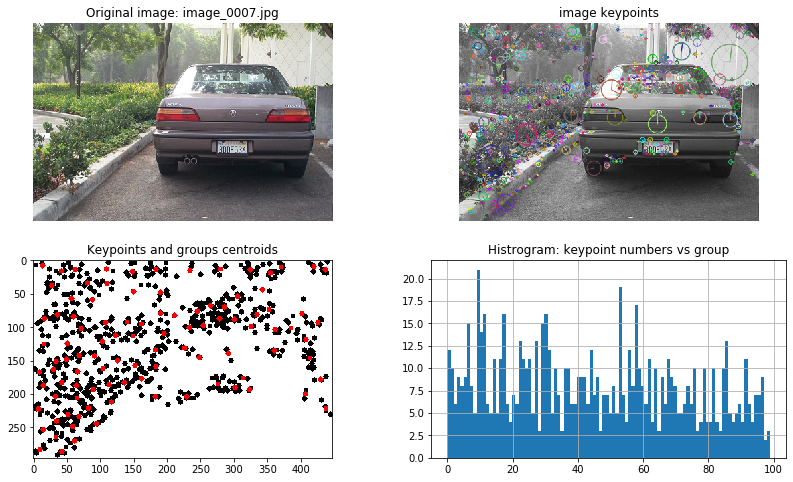

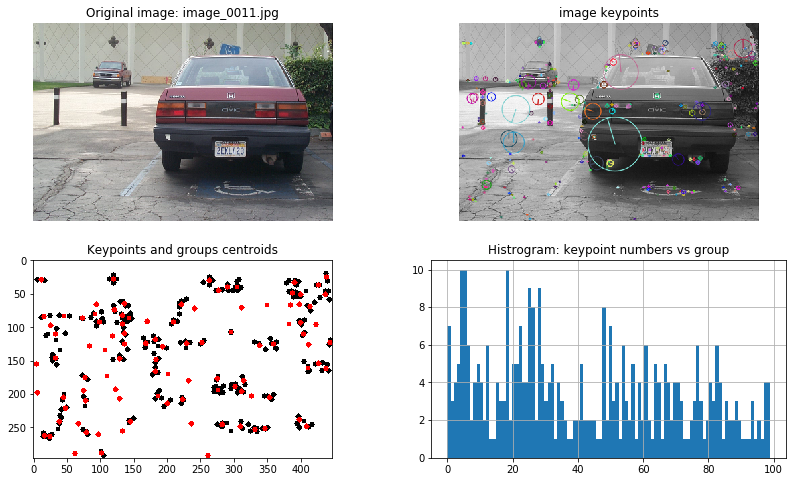

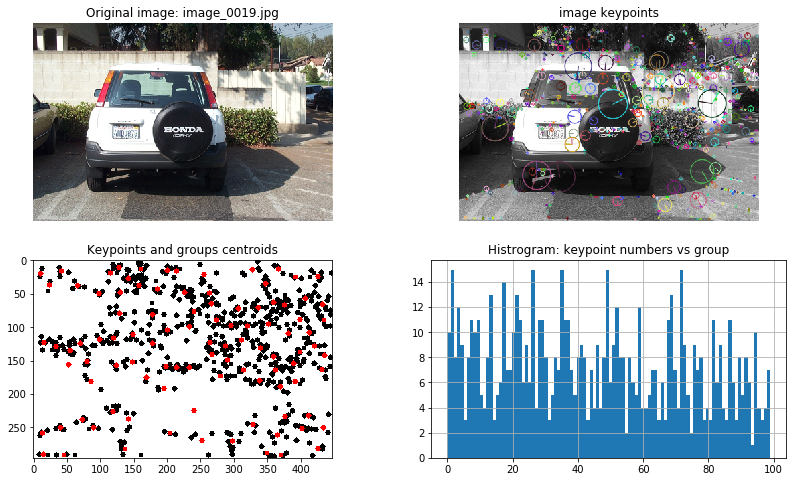

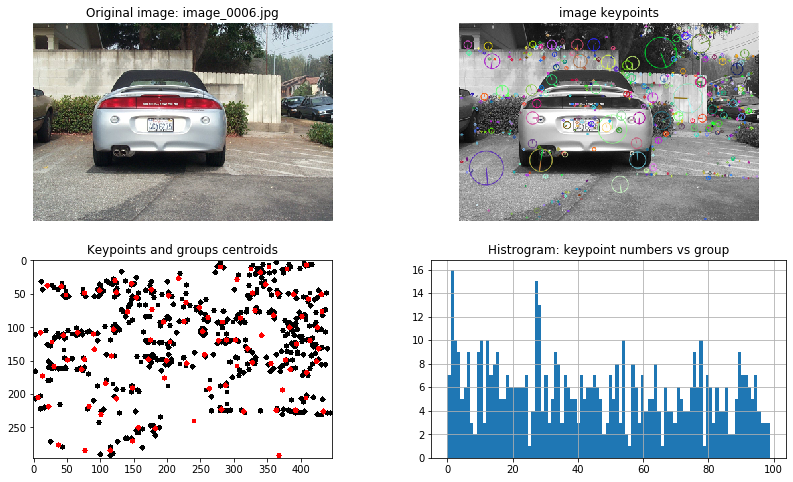

In [51]:
%matplotlib inline
#main function
def main6():
    
    dirname = 'files/cars/'
    # load the filename of car images
    filenames = [item for item in listdir(dirname)
                 if item[:6] == 'image_' and item[10:] == '.jpg']
    
    for name in filenames:

        image = cv2.cvtColor(cv2.imread(dirname + name, cv2.IMREAD_COLOR), cv2.COLOR_RGB2BGR)
        image = cv2.resize(image, (0,0), fx=0.5, fy=0.5)
        #display original image
        plt.figure(figsize=(14,8))
        plt.subplot(2,2,1)
        plt.imshow(image)
        plt.title('Original image: ' + name)
        plt.axis('off')
        
        #calculate the keypoints
        kp, des = imlip(image)
        kpmap = kpmat(kp)

        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        imout = cv2.drawKeypoints(gray, kp, gray, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

        #display output image
        plt.subplot(2,2,2)
        plt.imshow(imout)
        plt.title('image keypoints')
        plt.axis('off')

        # calculate centroids
        cent, label = groupdes(kp, des)
        
        # canvan = np.full(image.shape, 0)
        canvan = 255 * np.ones(image.shape, dtype=np.uint8)   
        for item in kp:
            center = tuple([int(c) for c in item.pt])
            cv2.circle(canvan, center, 4, (0, 0, 0), -1)
        for i in range(cent.shape[0]):
            # center = (int(c) for c in item.pt)
            center = (int(cent[i, 0]), int(cent[i, 1]))
            cv2.circle(canvan, center, 4, (255, 0, 0), -1)
        
        #display only keypoinst and centroids
        plt.subplot(2,2,3)
        plt.imshow(canvan)
        plt.title('Keypoints and groups centroids')

        #display histogram
        plt.subplot(2,2,4)
        hist, bins, patches = plt.hist(label, 100)
        plt.grid(True)
        plt.title('Histrogram: keypoint numbers vs group')

        plt.show()

        #Stored data using json
        #create dir
        directory = 'json/features_bags'
        if not os.path.exists(directory):
            os.makedirs(directory)

        filename = os.path.join(directory, name[:10] + '_features.json')

        data = {
            "centroids": cent.tolist(),
            "labels": label.tolist(),
            "histogram": hist.tolist(),
        }

        # stored data using a json
        storedata(filename, data)

#run main function
if __name__ == '__main__':
    main6()


### Results

The final algorithm clusters keypoints in 100 groups, according the position on the image.  Similar to last code, SIFT class is used to identify and extract local interested points, for this reason, **imlip** function is implemented. After to get keypoints and descriptors from each car image, this features are the input of **grupdes** function. 

**groupes** function computers centroids and an array that indicates which group each keypoint belongs. This can be obtained used **kmeans** algorithm, where distance and position (x,y) are the feature to sort keypoints. Function returns *centroids*, the numbers of centroids is the same numbers to groups. Each group have a centroid, and points closer to it belong to the group. The output array have the same length to numbers to keypoints, and its value indicate the centroid closer to each keypoints. 

So, the array can be used to make a **histogram**, the histogram show which groups have more keypoints. Similar to last code, original image and keypoints image are displayed. In addition centroids and keypoints are displayed, cetroids are represented by red starts and keypoints are black dots. 

For each image, centroids, histogram and output array is stored using a **json** file. Data are stored using a *dictionary* called **data**.  The **storedata** function is used to save data inside of **.json** file. 
